# Midterm Exam (Sample Solutions)

## Question 1-1

----


In [1]:
## Loading packages
import re
import nltk
from nltk.corpus import PlaintextCorpusReader
import pandas as pd
import unicodedata
import re

## Notebook Settings
pd.options.display.max_colwidth = 200

In [2]:
## Loading corpus files into one CSV

# jay_dir = 'midterm_inputdata/jay/'
# jay_corpus = PlaintextCorpusReader(jay_dir,'.*\.txt')

# jay = pd.DataFrame(
#     [(re.sub(r'\.txt$','',f), jay_corpus.raw(f)) for f in jay_corpus.fileids()],
#     columns=['title','lyric'])

In [3]:
## Loading CSV (from the original CSV)
jay = pd.read_csv('midterm_inputdata/jay.csv')


## Preprocessing Function
## remove extra linebreaks whitespaces and unicode category punctuations and symbols
def preprocess(doc):
    doc = re.sub(r'\n+', '\n', doc)
    doc = ''.join([
        c if unicodedata.category(c)[0] not in ["P", "S", "N"] else ' '
        for c in doc
    ])  ## symbols
    #doc= re.sub(r'[0-9a-zA-Z]+'," ", doc) ## remove english letters and numbers
    doc = ''.join([
        c if unicodedata.category(c) not in ["Ll", "Lu"] else ' ' for c in doc
    ])  ## alphabets
    doc = re.sub(r'[ \u3000]+', ' ', doc)
    doc = '\n'.join([line.strip() for line in doc.split('\n')])
    return doc


## Preprocess the corpus
jay['lyric_pre'] = [preprocess(l) for l in jay.lyric]

## Check two songs
jay.iloc[[100, 200], :]

,title,lyric,lyric_pre
100,斷了的弦,斷了的弦再怎麼練 我的感覺你已聽不見\n你的轉變像斷掉的弦 再怎麼接音都不對 你的改變我能夠分辨\n＊我沉默 你的話也不多 我們之間少了什麼 不說\n哎唷～微笑後表情終於有點難過(握著你的手) 問你決定了再走\n我突然釋懷的笑 笑聲盤旋半山腰\n隨風在飄搖啊搖 來到你的面前繞\n你淚水往下的掉 說會記住我的好 我也彎起了嘴角笑\n你的美已經給了誰 追了又追我要不回\n我瞭解離開樹的葉 屬於...,斷了的弦再怎麼練 我的感覺你已聽不見\n你的轉變像斷掉的弦 再怎麼接音都不對 你的改變我能夠分辨\n我沉默 你的話也不多 我們之間少了什麼 不說\n哎唷 微笑後表情終於有點難過 握著你的手 問你決定了再走\n我突然釋懷的笑 笑聲盤旋半山腰\n隨風在飄搖啊搖 來到你的面前繞\n你淚水往下的掉 說會記住我的好 我也彎起了嘴角笑\n你的美已經給了誰 追了又追我要不回\n我瞭解離開樹的葉 屬於地上...
200,你怎麼連話都說不清楚,這首歌沒有唱過．但是是我寫的．然後．寫給一個好朋友的歌\n那．我自己重新來唱．我覺得應該．版本真的也不錯\n想別的 可是在你眼中察覺什麼一閃而過\n怎是像是寂寞 於是我會更沉默\n沒說的 可是在你眼中察覺什麼一閃而過\n而我看她笑著走開 於是我裝做不懂 怎麼能拆穿你的不同\n偏偏 這地球 這麼擠 這麼小 這麼瘦 太陽刻意曬得那麼兇\n記得離別在拆散一點以後\n你怎麼連話都說不清楚 那溫柔的...,這首歌沒有唱過 但是是我寫的 然後 寫給一個好朋友的歌\n那 我自己重新來唱 我覺得應該 版本真的也不錯\n想別的 可是在你眼中察覺什麼一閃而過\n怎是像是寂寞 於是我會更沉默\n沒說的 可是在你眼中察覺什麼一閃而過\n而我看她笑著走開 於是我裝做不懂 怎麼能拆穿你的不同\n偏偏 這地球 這麼擠 這麼小 這麼瘦 太陽刻意曬得那麼兇\n記得離別在拆散一點以後\n你怎麼連話都說不清楚 那溫柔的...


## Question 1-2

-----


In [4]:
## packages
import pickle
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib
import matplotlib.pyplot as plt

## plotting settings
plt.style.use('ggplot')
matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams['font.sans-serif'] = ["PingFang HK"
                                          ]  ## set ur own chinese font

In [5]:
# ##############################################
# ## Uncommment this when word seg is needed####
# ##############################################

# import ckip_transformers
# from ckip_transformers.nlp import CkipWordSegmenter, CkipPosTagger
# #Initialize drivers
# ws_driver = CkipWordSegmenter(level=3, device=-1)
# pos_driver = CkipPosTagger(level=3, device=-1)

# def my_tokenizer(doc):
#     # `doc`: a list of corpus documents (each element is a document long string)
#     cur_ws = ws_driver(doc, use_delim = True, delim_set='\n')
#     cur_pos = pos_driver(cur_ws)
#     doc_seg = [[(x,y) for (x,y) in zip(w,p)]  for (w,p) in zip(cur_ws, cur_pos)]
#     return doc_seg

In [6]:
# %%time

# ##############################################
# ## Uncommment this when word seg is needed####
# ##############################################

## Perform word seg in Google Colab
## It takes about 40s in Google Colab

# jay_lyric_wordseg = my_tokenizer(list(jay.lyric_pre))

# import pickle
# with open('midterm-jay-lyric-wordseg.pickle', 'wb') as f:
#     pickle.dump(jay_lyric_wordseg, f, protocol=pickle.HIGHEST_PROTOCOL)

In [7]:
## Word-seg and preprocessing
with open('midterm-jay-lyric-wordseg.pickle', 'rb') as f:
    jay_lyric_wordseg = pickle.load(f)

fileids = list(jay.title)

## select words whose POS starts with N or V but NOT pronouns (Nh) or numbers (Neu)
jay_words = [[(w, p) for (w, p) in text if re.match(r'^[NV](?!(h|eu))', p)]
             for text in jay_lyric_wordseg]
jay_norm = [' '.join([w for w, p in text]) for text in jay_words]

In [8]:
## CountVectorizer
cv = CountVectorizer(token_pattern=r'[^\s]{2,}',
                     min_df=2)  ## use words len >=2
jay_bow = cv.fit_transform(jay_norm)
jay_array = jay_bow.toarray()

jay_bow_df = pd.DataFrame(jay_array,
                          columns=cv.get_feature_names(),
                          index=fileids)

## TfidfVectorizer
tv = TfidfVectorizer(min_df=2,
                     max_df=1.0,
                     norm='l2',
                     use_idf=True,
                     smooth_idf=True,
                     token_pattern=r'[^\s]{2,}')
tv_matrix = tv.fit_transform(jay_norm)
jay_tv_df = pd.DataFrame(tv_matrix.toarray(),
                         columns=tv.get_feature_names(),
                         index=fileids)

In [9]:
print(jay_bow_df.shape)
print(tv_matrix.shape)
jay_bow_df.head().round(2)
jay_tv_df.head().round(2)

(212, 2031)
(212, 2031)


,一下,一些,一切,一半,一幕幕,一樣,一次次,一生,一統,一行行,...,默劇,默契,默片,點亮,點心,點頭,鼓勵,鼓掌,鼻子,龍捲風
我是如此相信,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
英雄,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.13,0.0,0.0,0.0,0.0,0.0,0.0,0.0
雙截棍,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
開不了口,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
床邊故事,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
## Cluster Analysis

similarity_doc_matrix = cosine_similarity(tv_matrix)
similarity_doc_df = pd.DataFrame(similarity_doc_matrix,
                                 index=fileids,
                                 columns=fileids)

Z = linkage(similarity_doc_matrix, 'ward')

similarity_doc_df.round(2)

## Plot Dendrogram
plt.figure(figsize=(15, 40))
plt.title("Jay Chou Analysis")
plt.xlabel("Song Titles")
plt.ylabel('Distance')
color_threshold = 2
dendrogram(Z,
           labels=fileids,
           orientation='right',
           leaf_rotation=0,
           leaf_font_size=10,
           color_threshold=color_threshold,
           above_threshold_color='b')
plt.axvline(x=color_threshold, c='k', ls='--', lw=0.5)
plt.tight_layout()

## Question 2-1

-----


In [11]:
import nltk
import numpy as np
import random
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
pd.options.display.max_colwidth = 200

In [12]:
## Import train and test
with open('midterm_inputdata/chinese_name_gender_train.txt', 'r') as f:
    train = [
        l.replace('\n', '').split(',') for l in f.readlines()
        if len(l.split(',')) == 2
    ]

with open('midterm_inputdata/chinese_name_gender_test.txt', 'r') as f:
    test = [
        l.replace('\n', '').split(',') for l in f.readlines()
        if len(l.split(',')) == 2
    ]

## Sentiment Distrubtion for Train and Test
print(Counter([label for (words, label) in train]))
print(Counter([label for (words, label) in test]))

X_train = [name for (name, gender) in train]
X_test = [name for (name, gender) in test]
y_train = [gender for (name, gender) in train]
y_test = [gender for (name, gender) in test]

Counter({'男': 240078, '女': 239922})
Counter({'女': 60078, '男': 59922})


In [13]:
## Text Vectorization


## self-defined tokenzier
def myTokenizer(text):
    ngrams = []
    ngrams.append(text[1:])
    ngrams.append(text[1])
    ngrams.append(text[2])
    return ngrams


## CountVectorizer
cv = CountVectorizer(min_df=100, tokenizer=myTokenizer)

X_train_bow = cv.fit_transform(X_train)
X_test_bow = cv.transform(X_test)

print(X_train_bow.shape)
print(X_test_bow.shape)

(480000, 975)
(120000, 975)


In [14]:
# Check name-by-feature matrix
vocab = cv.get_feature_names()
X_train_bow_df = pd.DataFrame(X_train_bow.toarray(),
                              columns=vocab,
                              index=X_train)
X_train_bow_df.head()

,一,丁,三,世,丙,中,丹,丹丹,乃,久,...,麗萍,麗霞,麗麗,麟,黎,黎黎,鼎,齊,齡,龍
孫遠光,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
吳昌財,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
張俊達,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
馬豔蘭,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
宋燕敏,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Question 2-2

------


In [15]:
import numpy as np
import sklearn
from sklearn.metrics import f1_score, confusion_matrix, plot_confusion_matrix
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

import lime
from lime.lime_text import LimeTextExplainer

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('classic')

matplotlib.rcParams['font.sans-serif'] = ["PingFang HK"]
matplotlib.rcParams['figure.dpi'] = 300

In [16]:
%%time
model_gnb = GaussianNB()
model_gnb_acc = cross_val_score(estimator=model_gnb,
                                X=X_train_bow.toarray(),
                                y=y_train,
                                cv=10,
                                n_jobs=None)
model_gnb_acc

CPU times: user 1min 14s, sys: 46.6 s, total: 2min 1s
Wall time: 2min 5s


array([0.85516667, 0.85377083, 0.85664583, 0.85495833, 0.85522917,
       0.852     , 0.85447917, 0.85425   , 0.8533125 , 0.85383333])

In [17]:
%%time
model_lg = LogisticRegression(max_iter=1000)
model_lg_acc = cross_val_score(estimator=model_lg,
                               X=X_train_bow,
                               y=y_train,
                               cv=10,
                               n_jobs=None)
model_lg_acc

CPU times: user 46 s, sys: 552 ms, total: 46.5 s
Wall time: 51.1 s


array([0.9795625 , 0.98004167, 0.98060417, 0.98120833, 0.979625  ,
       0.98035417, 0.98033333, 0.98039583, 0.98122917, 0.98110417])

In [18]:
print("Mean Accuracy of Naive Bayes Model: ", model_gnb_acc.mean())
print("Mean Accuracy of Logistic Regression Model:", model_lg_acc.mean())

Mean Accuracy of Naive Bayes Model:  0.8543645833333334
Mean Accuracy of Logistic Regression Model: 0.9804458333333332


In [19]:
%%time
## Grid Search
parameters = {'C': (1, 5, 10)}
clf = GridSearchCV(model_lg, parameters, cv=10,
                   n_jobs=None)  ## `-1` run in parallel
clf.fit(X_train_bow, y_train)

CPU times: user 3min 35s, sys: 679 ms, total: 3min 35s
Wall time: 3min 43s


GridSearchCV(cv=10, estimator=LogisticRegression(max_iter=1000),
             param_grid={'C': (1, 5, 10)})

In [20]:
clf.best_params_

{'C': 10}

Text(0.5, 1.0, 'Confusion Matrix (Normalized %)')

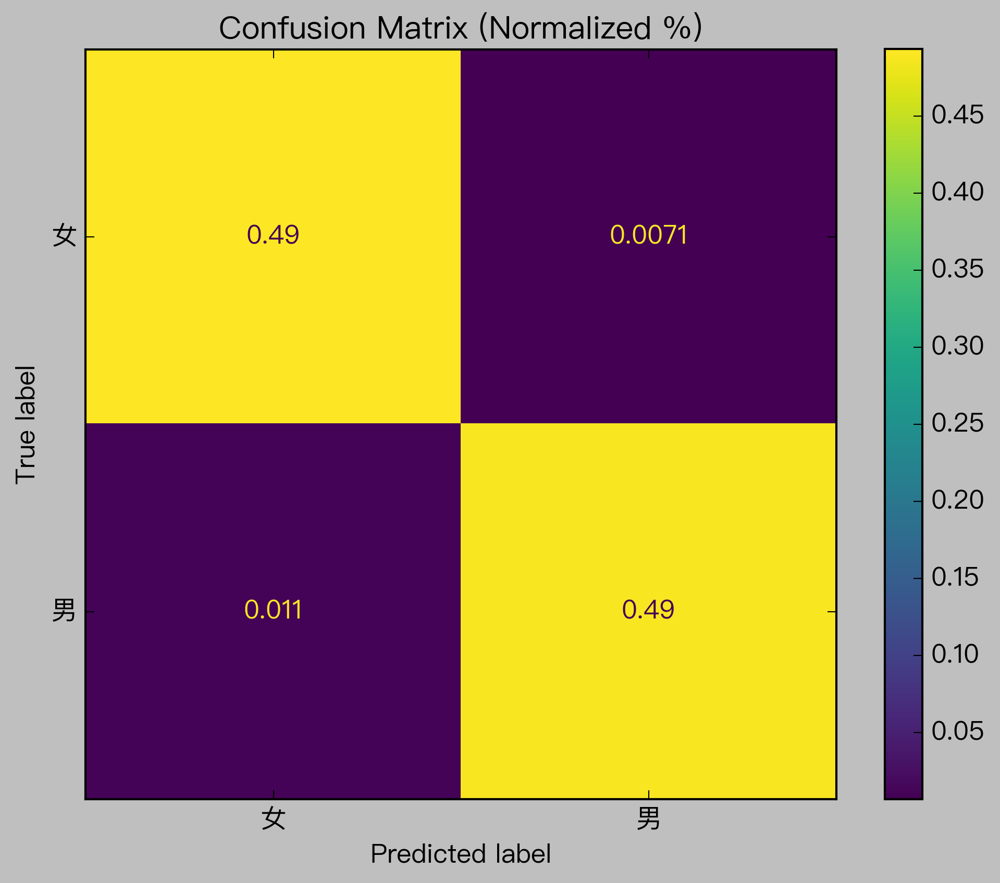

In [21]:
plot_confusion_matrix(clf, X_test_bow, y_test, normalize='all')
plt.title("Confusion Matrix (Normalized %)")

Text(0.5, 1.0, 'Confusion Matrix (Frequencies)')

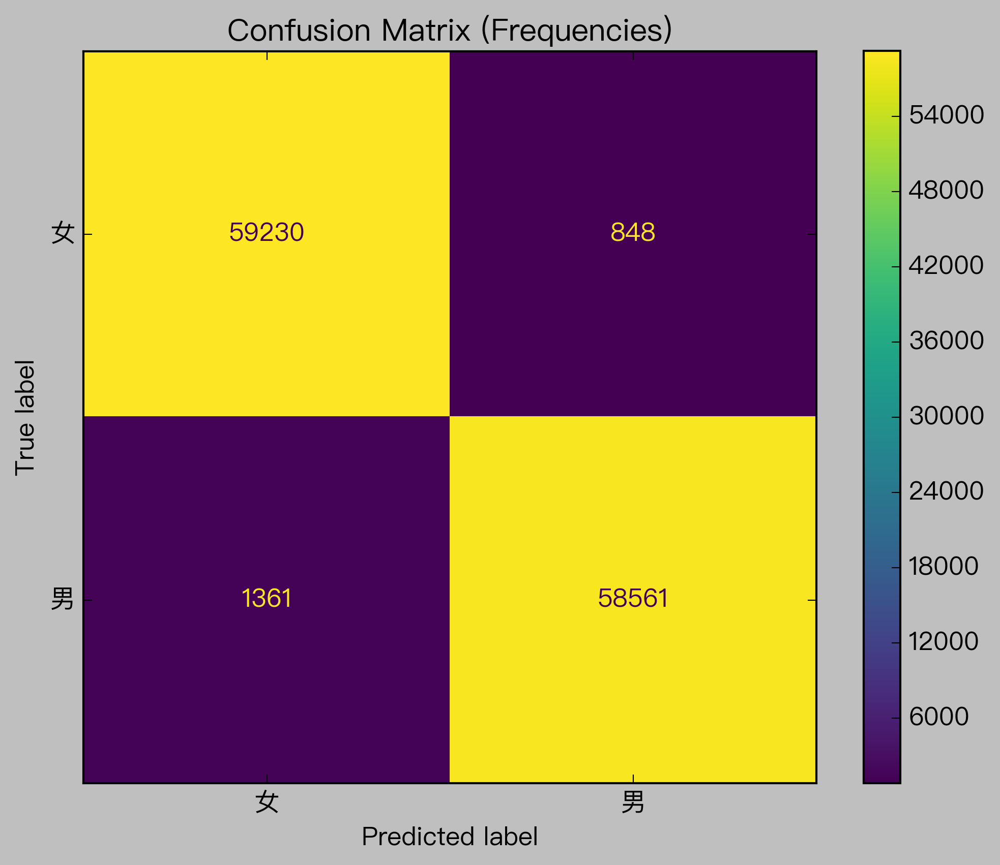

In [22]:
plot_confusion_matrix(clf, X_test_bow, y_test, normalize=None)
plt.title("Confusion Matrix (Frequencies)")

In [23]:
## Pipeline for LIME
pipeline = Pipeline([('vectorizer', cv),
                     ('clf', LogisticRegression(C=10, max_iter=1000))])
pipeline.fit(X_train, y_train)

Pipeline(steps=[('vectorizer',
                 CountVectorizer(min_df=100,
                                 tokenizer=<function myTokenizer at 0x7f84d1790400>)),
                ('clf', LogisticRegression(C=10, max_iter=1000))])

In [24]:
explainer = LimeTextExplainer(class_names=['女', '男'],
                              char_level=True,
                              bow=False)
test_name = ["王貴瑜", '林育恩', '張純映', '陳英雲']
explanations = []
for n in test_name:
    explanations.append(explainer.explain_instance(n, pipeline.predict_proba))

In [25]:
explanations[0].show_in_notebook(text=True)

In [26]:
explanations[1].show_in_notebook(text=True)

In [27]:
explanations[2].show_in_notebook(text=True)

In [28]:
explanations[3].show_in_notebook(text=True)

In [29]:
## Feature Importance Analysis
importances = pipeline.named_steps['clf'].coef_.flatten()

## Select top 10 positive/negative weights
top_indices_pos = np.argsort(
    importances)[::-1][:10]  ## top 10 for positve weights
top_indices_neg = np.argsort(importances)[::-1][
    -10:]  ## bottom 10 for negative weights

## Get featnames from tfidfvectorizer
feature_names = np.array(
    cv.get_feature_names())  # List indexing is different from array
feature_importance_df = pd.DataFrame({
    'FEATURE':
    feature_names[np.concatenate((top_indices_pos, top_indices_neg))],
    'IMPORTANCE':
    importances[np.concatenate((top_indices_pos, top_indices_neg))],
    'SENTIMENT': ['pos' for _ in range(len(top_indices_pos))] +
    ['neg' for _ in range(len(top_indices_neg))]
})
feature_importance_df

,FEATURE,IMPORTANCE,SENTIMENT
0,剛,11.469095,pos
1,兵,11.025539,pos
2,強,10.853713,pos
3,豪,10.237200,pos
4,生,10.011628,pos
5,斌,9.964699,pos
6,臣,9.946304,pos
7,虎,9.904538,pos
8,濤,9.798495,pos
9,鋒,9.736642,pos


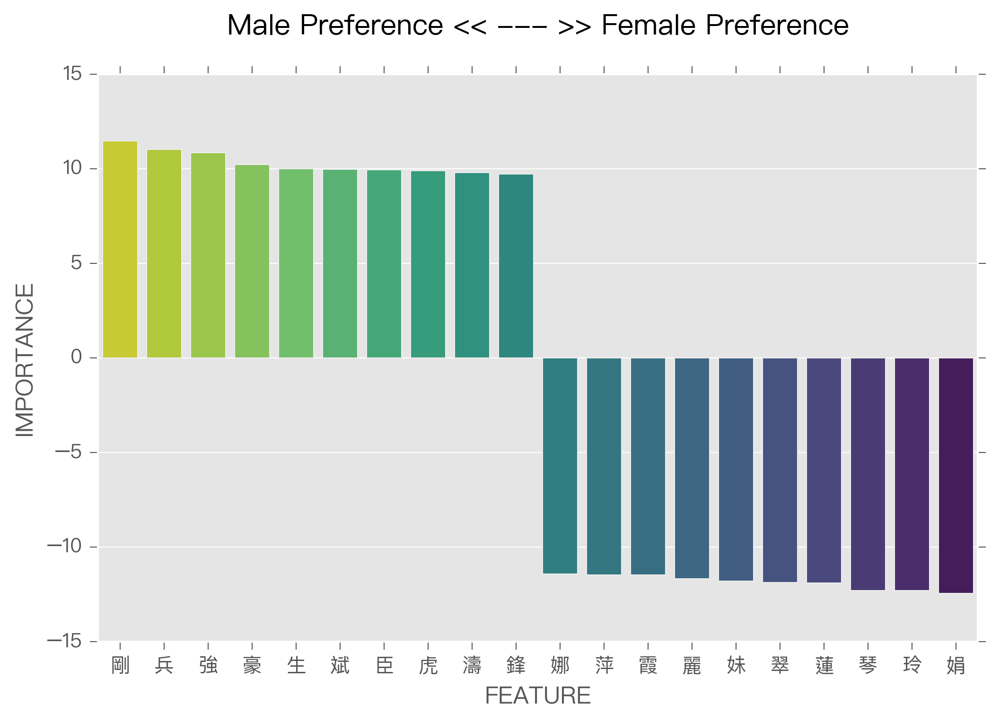

In [30]:
## Visualize feature importance
plt.style.use('ggplot')

matplotlib.rcParams['font.sans-serif'] = ["PingFang HK"]
matplotlib.rcParams['figure.dpi'] = 300
plt.figure(figsize=(8, 5))
pal = sns.color_palette("viridis", len(feature_importance_df.index))
sns.barplot(x=feature_importance_df['FEATURE'],
            y=feature_importance_df['IMPORTANCE'],
            palette=np.array(pal[::-1]))
plt.title("Male Preference << --- >> Female Preference\n")
plt.savefig('midterm/_question2-2-output-featimportance.jpeg',
            bbox_inches='tight',
            dpi=300)

## Question 3-1


----


In [31]:
import pandas as pd
import unicodedata
import re
import nltk
import pickle
import numpy as np
import sklearn
from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import dendrogram, linkage
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
sns.set(font_scale=0.7)
matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams['font.sans-serif'] = ["PingFang HK"]
pd.options.display.float_format = '{:,.2f}'.format

In [32]:
## remove extra linebreaks whitespaces and unicode category punctuations and symbols
def preprocess(doc):
    doc = re.sub(r'\n+', '\n', doc)
    doc = ''.join([
        c if unicodedata.category(c)[0] not in ["P", "S", "N"] else ' '
        for c in doc
    ])  ## symbols
    #doc= re.sub(r'[0-9a-zA-Z]+'," ", doc) ## remove english letters and numbers
    doc = ''.join([
        c if unicodedata.category(c) not in ["Ll", "Lu"] else ' ' for c in doc
    ])
    doc = re.sub(r'[ \u3000]+', ' ', doc)
    doc = '\n'.join([line.strip() for line in doc.split('\n')])
    return doc


apple_df = pd.read_csv('midterm_inputdata/apple5000.csv')
apple_df['text_pre'] = [preprocess(text) for text in apple_df.text]

apple_df.head()

,doc_id,text,text_pre
0,1,【鄧玉瑩╱台中報導】台中市警二分局育才派出所爆發疑似集體索賄案，台中地檢署檢察官指揮調查局中部機動組查出，轄區警員柯文山利用職權之便，向轄區飯店、色情業者索賄，昨天深夜向地院聲請羈押獲准。派出所隨即表示，將對柯某撤職查辦、從嚴處分。\n\n\n台中地檢署檢察官吳祚延指揮調查局中機組幹員，搜索台中市警二分局育才派出所，帶回警員柯文山，進行偵訊。檢調同時到台中市「合利太」飯店大樓展開搜索，除帶...,鄧玉瑩 台中報導 台中市警二分局育才派出所爆發疑似集體索賄案 台中地檢署檢察官指揮調查局中部機動組查出 轄區警員柯文山利用職權之便 向轄區飯店 色情業者索賄 昨天深夜向地院聲請羈押獲准 派出所隨即表示 將對柯某撤職查辦 從嚴處分\n台中地檢署檢察官吳祚延指揮調查局中機組幹員 搜索台中市警二分局育才派出所 帶回警員柯文山 進行偵訊 檢調同時到台中市 合利太 飯店大樓展開搜索 除帶回帳冊 飯店...
1,2,陸軍542旅下士洪仲丘關禁閉被操死，該旅副旅長何江忠昨遭軍高檢向最高軍事法院聲押獲准。何江忠的前同事說：「他（何江忠）只能用『陰險』兩字形容，得罪他都沒好下場。」還說他常用官威逼部下，「仗勢欺人、人神共憤，大家都不喜歡他。」被他帶過的阿兵哥說，懲處到了何手上都會加重，簡直是「大魔頭」。\n曾與何江忠共事1年的軍官昨向《蘋果》爆料，前年何江忠還在馬祖東引擔任副指揮官時，遇到年度本職學能鑑測，...,陸軍 旅下士洪仲丘關禁閉被操死 該旅副旅長何江忠昨遭軍高檢向最高軍事法院聲押獲准 何江忠的前同事說 他 何江忠 只能用 陰險 兩字形容 得罪他都沒好下場 還說他常用官威逼部下 仗勢欺人 人神共憤 大家都不喜歡他 被他帶過的阿兵哥說 懲處到了何手上都會加重 簡直是 大魔頭\n曾與何江忠共事 年的軍官昨向 蘋果 爆料 前年何江忠還在馬祖東引擔任副指揮官時 遇到年度本職學能鑑測 他卻要步兵學校裁...
2,3,終於拿到冠軍，感覺真是棒，尤其是從蔣宸豑的手上搶過來，算是報了一箭之仇。其實我今天的推桿感覺真的很不好，有好幾次3呎內的短推都錯過，不然也不會打得這麼累。」今年第3次參賽，前兩次分別在第1輪及8強賽輸給蔣宸豑。\n\n\n年齡：17歲身高：181公分體重：80公斤就讀學校：啟英高中二年級球齡：6年\n\n\n \n,終於拿到冠軍 感覺真是棒 尤其是從蔣宸豑的手上搶過來 算是報了一箭之仇 其實我今天的推桿感覺真的很不好 有好幾次 呎內的短推都錯過 不然也不會打得這麼累 今年第 次參賽 前兩次分別在第 輪及 強賽輸給蔣宸豑\n年齡 歲身高 公分體重 公斤就讀學校 啟英高中二年級球齡 年\n\n
3,4,【陳毓婷╱台北報導】過去業績不甚理想的中國人壽（2823），今年初找來南山人壽的專業經理人王銘陽擔任總經理後，不但保費收入大幅成長，而且獲利也出現轉機，今年上年已經轉虧為盈，小賺667萬元，擺脫今年第一季虧損近1.6億元的陰霾。\n\n\n中壽今年上半年的保費收入達155.7億元，較去年同期的96.6億元成長62%，與國內壽險業今年上半年保費收入比較，中壽首度擠進前五名。通常壽險公司在衝刺...,陳毓婷 台北報導 過去業績不甚理想的中國人壽 今年初找來南山人壽的專業經理人王銘陽擔任總經理後 不但保費收入大幅成長 而且獲利也出現轉機 今年上年已經轉虧為盈 小賺 萬元 擺脫今年第一季虧損近 億元的陰霾\n中壽今年上半年的保費收入達 億元 較去年同期的 億元成長 與國內壽險業今年上半年保費收入比較 中壽首度擠進前五名 通常壽險公司在衝刺新契約保單的情況下 成本支出會墊高 中壽今年第 季就...
4,5,台灣國際語文教育協會假借中央機關指導名義，招攬學員參加該機構舉辦的觀光研習營，活動宣稱「參加滿三梯次可退費」，實際上卻任意改期、提高收費。學員幾經爭執、《蘋果》追查發現真相後，業者同意學員的退費要求。攝影．報導╱褚明達\n台中市徐先生說，去年10月下旬，他看到台灣國際語文教育協會（以下簡稱台協）招攬「台灣觀光親善大使甄選研習營」學員的網路廣告，因內容豐富，他立即報名參加。台協在廣告上註明將...,台灣國際語文教育協會假借中央機關指導名義 招攬學員參加該機構舉辦的觀光研習營 活動宣稱 參加滿三梯次可退費 實際上卻任意改期 提高收費 學員幾經爭執 蘋果 追查發現真相後 業者同意學員的退費要求 攝影 報導 褚明達\n台中市徐先生說 去年 月下旬 他看到台灣國際語文教育協會 以下簡稱台協 招攬 台灣觀光親善大使甄選研習營 學員的網路廣告 因內容豐富 他立即報名參加 台協在廣告上註明將請 外...


In [33]:
# %%time

## Spacy Parsing

# import spacy
# nlp = spacy.load("zh_core_web_lg")

# mod_head=[]

# for doc in nlp.pipe(apple_df.text_pre, n_process=-1):
#     for t in doc:
#         if (t.dep_ == "amod"):
#             mod_head.append((t.text, t.head.text))
# len(mod_head)

# import pickle
# with open('midterm-apple-mod-head-lg.pickle', 'wb') as f:
#     pickle.dump(mod_head, f, protocol=pickle.HIGHEST_PROTOCOL)

In [34]:
with open('midterm-apple-mod-head-lg.pickle', 'rb') as f:
    mod_head = pickle.load(f)

In [35]:
## filter two-syllable NOUNS only
mod_head_fd = nltk.FreqDist([(m, n) for (m, n) in mod_head
                             if len(n) >= 2])  ## for later use

mod_head_fd2 = nltk.FreqDist([
    m + '_' + n for (m, n) in mod_head if len(n) >= 2
])  ## for data frame output
mod_head_df = pd.DataFrame(list(mod_head_fd2.items()),
                           columns=["MOD-NOUN", "Frequency"])
mod_head_df.sort_values(['Frequency'], ascending=[False]).head(20)

,MOD-NOUN,Frequency
268,新_台幣,109
916,女_主角,82
18,總_經理,60
350,大_聯盟,48
162,新_北報,44
2302,液晶_電視,41
1301,男_主角,40
828,大_股東,39
198,好_朋友,39
280,新_產品,39


## Question 3-2

-------

In [36]:
## Get nouns and mods dict indices
nouns = {noun: i for i, noun in enumerate(set([head for (mod, head) in mod_head]))}
mods = {mod: i for i, mod in enumerate(set([mod for (mod, head) in mod_head]))}

## Create Noun by Modifiers Matrix
noun_by_mod = np.zeros(shape=(len(nouns), len(mods)), dtype='float32')
for ((m, n), c) in mod_head_fd.items():
    noun_by_mod[nouns[n], mods[m]] = noun_by_mod[nouns[n], mods[m]] + c

print(noun_by_mod.shape)

(16531, 11302)


In [37]:
## Filtering heads and modifiers
col_sum_ind = np.argsort(-noun_by_mod.sum(axis=0))
row_sum_ind = np.argsort(-noun_by_mod.sum(axis=1))

col_cut = 10
row_cut = 70
col_ind = [i for i, s in enumerate(noun_by_mod.sum(axis=0)) if s > col_cut]
row_ind = [i for i, s in enumerate(noun_by_mod.sum(axis=1)) if s > row_cut]
print(len(row_ind))
print(len(col_ind))
noun_by_mod_filtered_df = pd.DataFrame(noun_by_mod, columns=mods,
                                       index=nouns).iloc[row_ind, col_ind]
print(noun_by_mod_filtered_df.shape)

43
631
(43, 631)


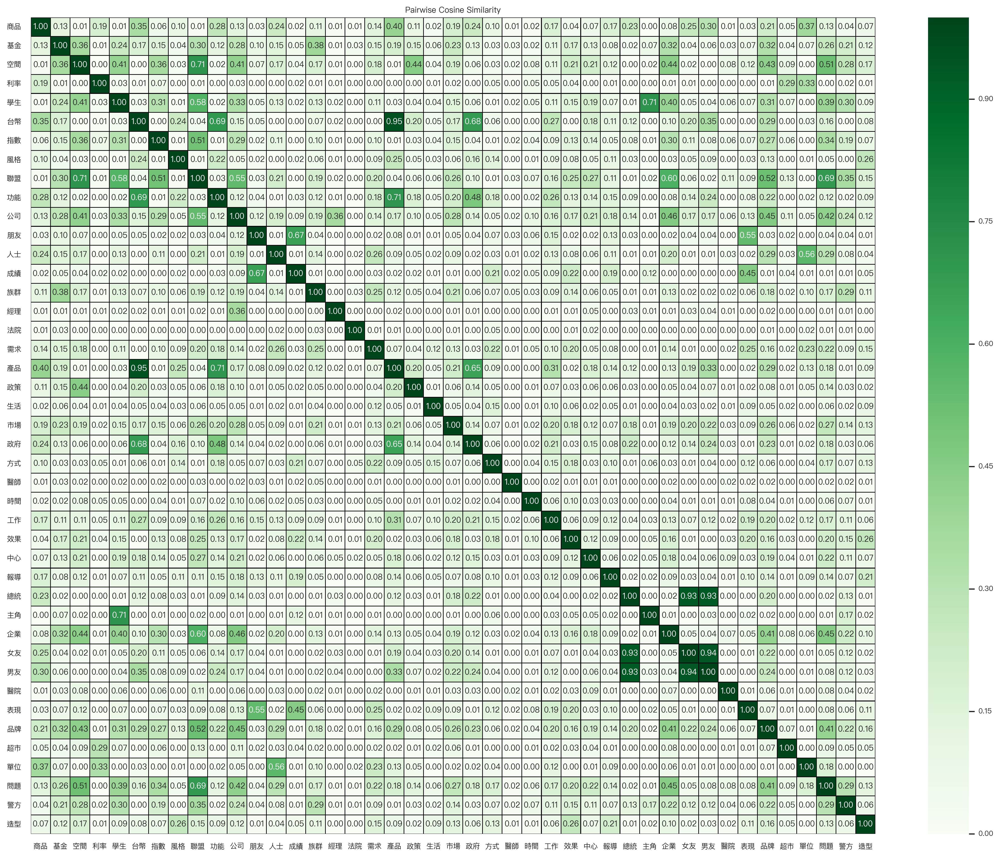

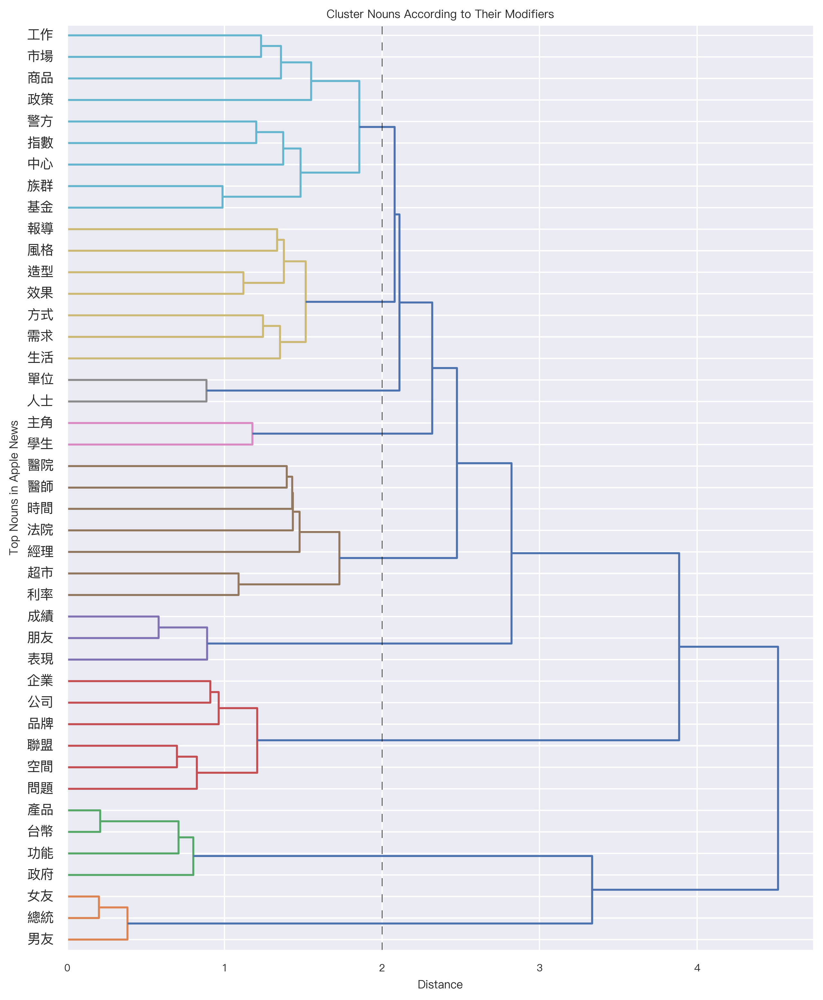

In [38]:
## Cluster analysis
similarity_noun = cosine_similarity(noun_by_mod_filtered_df)
similarity_noun_df = pd.DataFrame(similarity_noun,
                                  index=noun_by_mod_filtered_df.index,
                                  columns=noun_by_mod_filtered_df.index)
Z = linkage(similarity_noun, 'ward')

## Plotting Similarity Matrix
plt.figure(figsize=(20, 15))
cf_hm1 = sns.heatmap(similarity_noun_df,
                     annot=True,
                     fmt='.2f',
                     xticklabels=similarity_noun_df.index,
                     yticklabels=similarity_noun_df.index,
                     linewidths=.5,
                     linecolor='black',
                     cmap="Greens")
plt.yticks(rotation=0)
plt.title('Pairwise Cosine Similarity')

## Plotting dendrogram
color_threshold = 0.6
plt.figure(figsize=(10, 12))
plt.title("Cluster Nouns According to Their Modifiers")
plt.xlabel("Distance")
plt.ylabel('Top Nouns in Apple News')
color_threshold = 2
dendrogram(Z,
           labels=list(noun_by_mod_filtered_df.index),
           orientation='right',
           leaf_rotation=0,
           leaf_font_size=10,
           color_threshold=color_threshold,
           above_threshold_color='b')
plt.axvline(x=color_threshold, c='k', ls='--', lw=0.5)